# Exercise: Differentiate Between Left and Right Steps

In [40]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from pathlib import Path
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from scipy.signal import butter, filtfilt
from kielmat.datasets import mobilised

Here, we will detect gait sequences for continuous monitoring of physical assessment using a lower back-worn IMU. The data is collected as part of the Mobilise-D Technical Validation Study ([Micó-Amigo et al., 2023](https://zenodo.org/records/7547125)). Subjects wore an IMU attached to their lower back for about 2.5 hours in their usual environment. Here, we have cut the data such that the file was not too big.

In [2]:
DATASET_PATH = Path("../datasets/mobilised")
COHORT = "HA"
recording = mobilised.load_recording(
    dataset_path=DATASET_PATH, cohort=COHORT, file_name="data.mat", progressbar=False
)

As usual, we first extract some relevant metadata, for example, the sampling frequency.

In [12]:
sampling_freq_Hz = ... # YOUR CODE HERE

The next initial step is to take a look at the data. See if there are any patterns that can be detected visually. Do the data meet your expectations?

- Visualize the data by making two subplots with shared x axis. The top plot shows the acceleration data, and the bottom plot shows the angular velocity data. Use different colors for the different axes.

In [13]:
fig = make_subplots(rows=2, cols=1, shared_xaxes=True)
for row_idx, channel_type in enumerate(["ACCEL", "GYRO"]):
    for channel_comp in ["x", "y", "z"]:
        fig.add_trace(
            go.Scatter(
                x=... # YOUR CODE HERE,
                y=... # YOUR CODE HERE,
                mode="lines",
                name=f"LowerBack_{channel_type}_{channel_comp}",
            ),
            row=row_idx + 1,
            col=1
        )
    fig.update_yaxes(title_text=f"{channel_type}", row=row_idx + 1, col=1)
fig.update_xaxes(title_text="time (s)", row=2, col=1)
fig.show()

## Detect Gait Sequences

Continuous monitoring of physical activity by means of an IMU involves several processing steps. First, we will detect gait sequences, which already tells us about the quantify of walking (number of gait sequences, number of steps).

- Import the `kielmat` implementation of the Paraschiv-Ionescu gait detection algorithm
- Run the algorithm on the IMU data

In [10]:
from ... import ... # YOUR CODE HERE

gsd = ... # YOUR CODE HERE
gsd = gsd.detect(
    data=... # YOUR CODE HERE, 
    sampling_freq_Hz=sampling_freq_Hz
)

5 gait sequence(s) detected.


In [11]:
gsd.gait_sequences_

,onset,duration,event_type,tracking_system
0,12.200,36.975,gait sequence,None
1,57.975,17.525,gait sequence,None
2,88.625,25.325,gait sequence,None
3,117.325,251.700,gait sequence,None
4,378.300,8.450,gait sequence,None


Again, let us take a look at the detected gait sequences by plotting the data and highlighting the detected gait sequences.

- Do these results meet your expectations?

In [21]:
fig = go.Figure()
for _, (onset, duration) in gsd.gait_sequences_[["onset", "duration"]].iterrows():
    fig.add_vrect(x0=..., x1=..., fillcolor="pink", line_width=0, opacity=0.35)  # YOUR CODE HERE
for channel_comp in ["x", "y", "z"]:
    fig.add_trace(
        go.Scatter(
            x=... # YOUR CODE HERE,
            y=... # YOUR CODE HERE,
            mode="lines",
            name=f"LowerBack_ACCEL_{channel_comp}",
        )   
    )
fig.update_yaxes(title_text="acceleration (g)")
fig.update_xaxes(title_text="time (s)")
fig.show()

## Detect Initial Contacts

The next step in the typical processing of IMU data is to identify consecutive initial contacts within each gait sequence.

- Run the initial contact detection algorithm on the IMU data

In [22]:
from ... import ... # YOUR CODE HERE
icd = ... # YOUR CODE HERE
icd = icd.detect(
    data=... # YOUR CODE HERE, 
    sampling_freq_Hz=sampling_freq_Hz,
    v_acc_col_name="LowerBack_ACCEL_x",
    gait_sequences=... # YOUR CODE HERE
)

In [23]:
icd.initial_contacts_

,onset,event_type,duration,tracking_systems
0,12.850,initial contact,0,None
1,13.400,initial contact,0,None
2,14.000,initial contact,0,None
3,14.625,initial contact,0,None
4,15.175,initial contact,0,None
...,...,...,...,...
634,384.000,initial contact,0,None
635,384.575,initial contact,0,None
636,385.175,initial contact,0,None
637,385.750,initial contact,0,None


For the ease of processing, we will select the first gait sequence for the remainder of the exercise.

- Plot the data and highlight the detected initial contacts

In [30]:
start_idx = ... # YOUR CODE HERE
end_idx = ... # YOUR CODE HERE
first_gait_seq = icd.initial_contacts_[
    (icd.initial_contacts_["onset"] >= gsd.gait_sequences_["onset"][0]) &
    (icd.initial_contacts_["onset"] < gsd.gait_sequences_["onset"][0] + gsd.gait_sequences_["duration"][0])
]

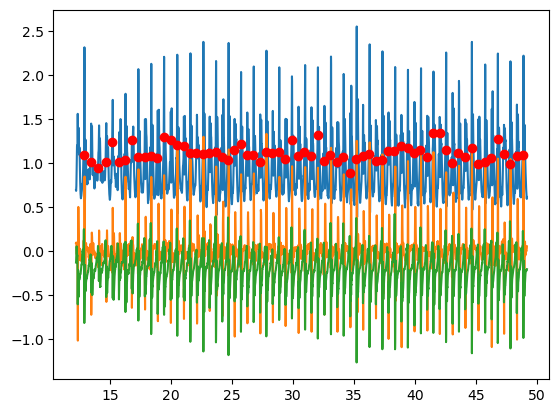

In [39]:
fig, ax = plt.subplots()
ax.plot(
    np.arange(start_idx, end_idx) / sampling_freq_Hz,
    recording.data["SU"].loc[start_idx:end_idx-1, [f"LowerBack_ACCEL_{x}" for x in "xyz"]],
)
ax.plot(
    first_gait_seq["onset"].values,
    recording.data["SU"].loc[
        (first_gait_seq["onset"].to_numpy() * sampling_freq_Hz).astype(int),
        "LowerBack_ACCEL_x"
    ],
    "ro"
)
plt.show()

## Differentiate Between Left and Right Steps

Finally, we will differentiate between left and right steps within each gait sequence. We have the initial contacts, but we need to determine which foot is responsible for each initial contact. Therefore, we will use the vertical angular velocity data to determine the foot responsible for each initial contact ([McCamley et al., 2012](https://doi.org/10.1016/j.gaitpost.2012.02.019)).

- subtract the signal mean of the vertical angular velocity signal
- apply a lowpass filter (4th order Butterworth filter with 2 Hz cutoff frequency)
- assign the initial contacts to the left or right foot based on the sign of the filtered vertical angular velocity signal

In [53]:
gyr_v = ... # YOUR CODE HERE, select the vertical angular velocity component
gyr_v = ... # YOUR CODE HERE, subtract the mean value

# Design a low-pass Butterworth filter
cutoff_freq_Hz = ... # YOUR CODE HERE
b, a = ... # YOUR CODE HERE
gyr_v_filt = filtfilt(..., ..., x=..., padtype="odd", padlen=3 * (max(len(b), len(a)) - 1))  # YOUR CODE HERE

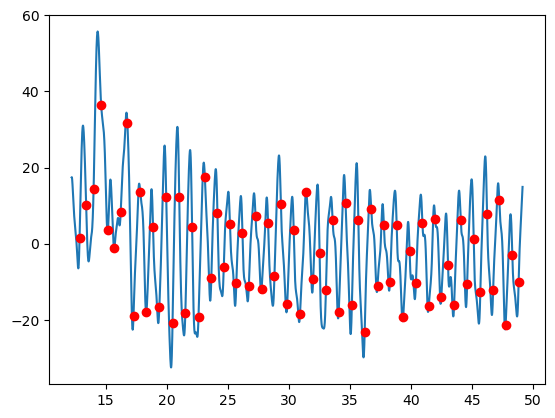

In [56]:
fig, ax = plt.subplots()
ax.plot(np.arange(start_idx, end_idx) / sampling_freq_Hz, gyr_v_filt[start_idx:end_idx])
ax.plot(
    first_gait_seq["onset"].values,
    gyr_v_filt[(first_gait_seq["onset"].to_numpy() * sampling_freq_Hz).astype(int)],
    "ro"
)
plt.show()

Finally, based on the sign of the angular velocity signal, we can differentiate between left and right steps.

- Assign the initial contacts to the left or right foot

In [59]:
initial_contacts_df = first_gait_seq.copy()
initial_contacts_df["side"] = [
    "right" if ... else "left" for idx in ...  # YOUR CODE HERE
]
initial_contacts_df

,onset,event_type,duration,tracking_systems,side
0,12.850,initial contact,0,None,right
1,13.400,initial contact,0,None,right
2,14.000,initial contact,0,None,right
3,14.625,initial contact,0,None,right
4,15.175,initial contact,0,None,right
...,...,...,...,...,...
64,46.750,initial contact,0,None,left
65,47.250,initial contact,0,None,right
66,47.775,initial contact,0,None,left
67,48.325,initial contact,0,None,left


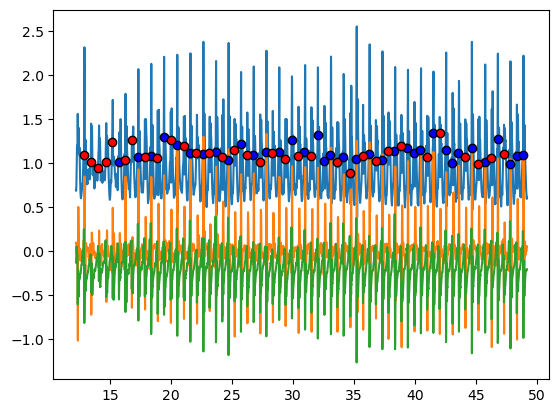

In [63]:
fig, ax = plt.subplots()
ax.plot(
    np.arange(start_idx, end_idx) / sampling_freq_Hz,
    recording.data["SU"].loc[start_idx:end_idx-1, [f"LowerBack_ACCEL_{x}" for x in "xyz"]],
)
for lr, color in zip(["left", "right"], ["blue", "red"]):
    indices = (initial_contacts_df[initial_contacts_df["side"] == lr]["onset"].to_numpy() * sampling_freq_Hz).astype(int)

    ax.plot(
        indices / sampling_freq_Hz,
        recording.data["SU"].loc[
            indices,
            "LowerBack_ACCEL_x"
        ],
        mfc=color, marker="o", ls="none", mec="k"
    )
plt.show()

Obviously, the algorithm does not work flawlessly. Can you think of any improvements?